# WHAT YOU WILL SEE

* Almost all computer vision methods used in this field
* Layer separation
* Spectural distribution
* Structural skeleton
* Identifying the tumor area with pixels
* Detecting points of designated tumor area
* Segmentation orientations
* Segmentation over dimensions
* Functional approaches
* 3 different models

![](https://ars.els-cdn.com/content/image/1-s2.0-S0006899320303772-gr2.jpg)

# PACKAGES AND LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import random
import time
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
import imageio
from IPython.display import Image
import matplotlib.image as mpimg
from skimage.transform import resize
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import zipfile
from io import BytesIO
from nibabel import FileHolder
from nibabel.analyze import AnalyzeImage
import PIL
from IPython import display
from skimage.morphology import convex_hull_image, erosion
from skimage.morphology import square
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage import data, io, filters
import skimage
#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN,\
LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D,Reshape, Conv2DTranspose, LeakyReLU, ReLU
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

# OVERVIEW AND METHODS

#### EXAMPLE IMAGE AND MASK

In [2]:
Example_Image_ONE = "../input/brats-custom-dataset/brain_tumor_custom/Tumor/TCGA_CS_4943_20000902_13.tif"
Example_Mask_ONE = "../input/brats-custom-dataset/brain_tumor_custom/Mask/TCGA_CS_4943_20000902_13_mask.tif"

In [3]:
Example_Image_TWO = "../input/brats-custom-dataset/brain_tumor_custom/Tumor/TCGA_CS_4941_19960909_14.tif"
Example_Mask_TWO = "../input/brats-custom-dataset/brain_tumor_custom/Mask/TCGA_CS_4941_19960909_14_mask.tif"

In [4]:
Example_Image_THREE = "../input/brats-custom-dataset/brain_tumor_custom/Tumor/TCGA_CS_4943_20000902_19.tif"
Example_Mask_THREE = "../input/brats-custom-dataset/brain_tumor_custom/Mask/TCGA_CS_4943_20000902_19_mask.tif"

#### DISPLAYING

In [5]:
plt.style.use("dark_background")

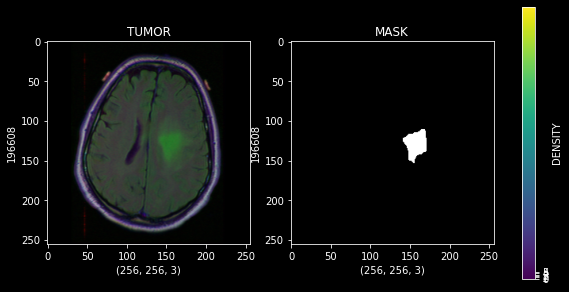

In [6]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_ONE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

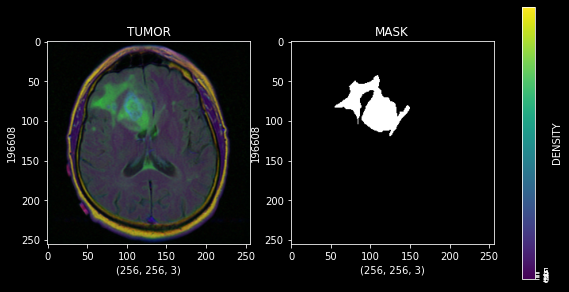

In [7]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_TWO),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

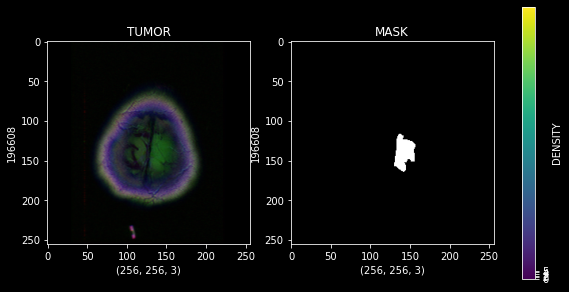

In [8]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_THREE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

#### SPECTRUM TESTING

##### JET

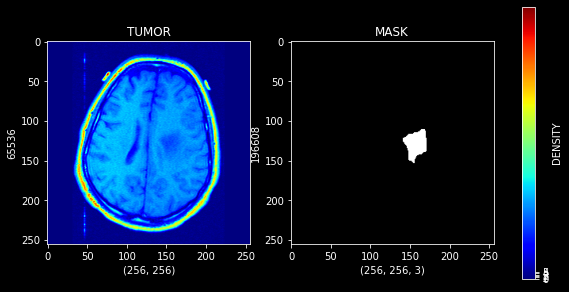

In [9]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_ONE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="jet")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

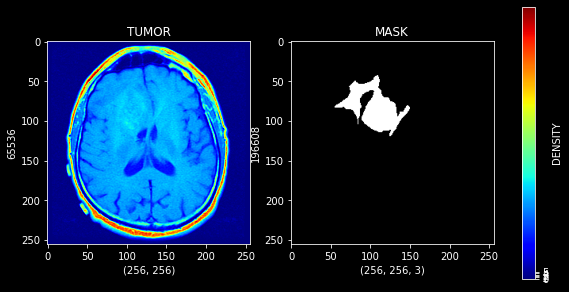

In [10]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_TWO),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="jet")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

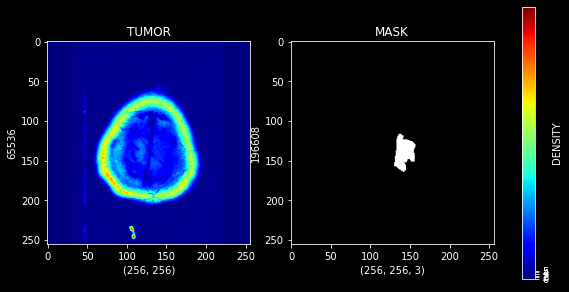

In [11]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_THREE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="jet")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

##### HOT

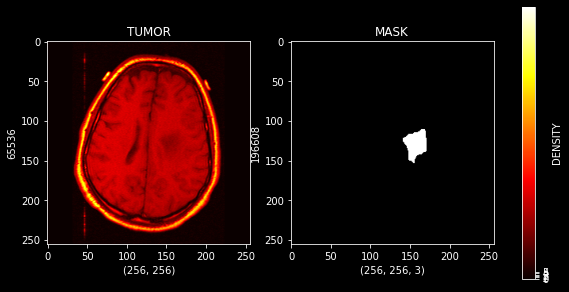

In [12]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_ONE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="hot")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

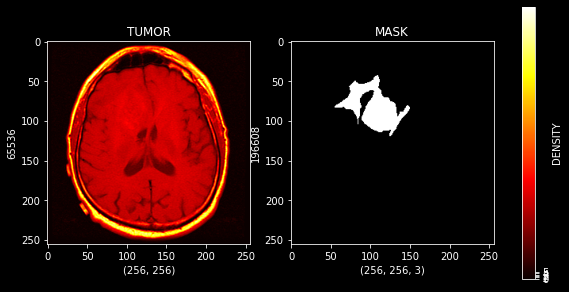

In [13]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_TWO),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="hot")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

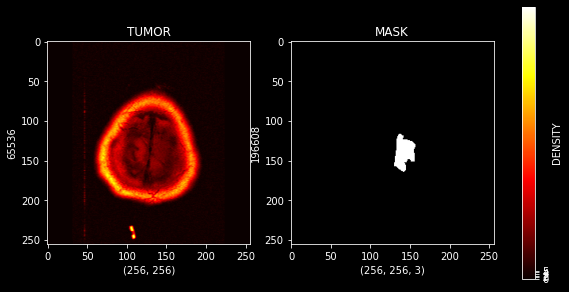

In [14]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_THREE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="hot")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

##### SPECTRAL

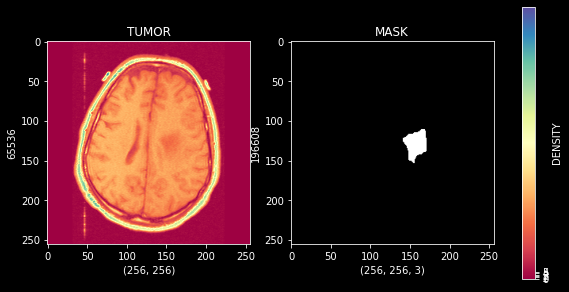

In [15]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_ONE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="Spectral")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

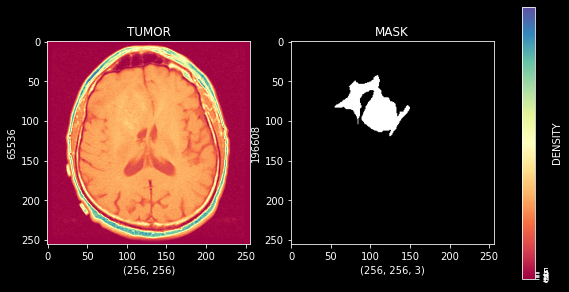

In [16]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_TWO),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="Spectral")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

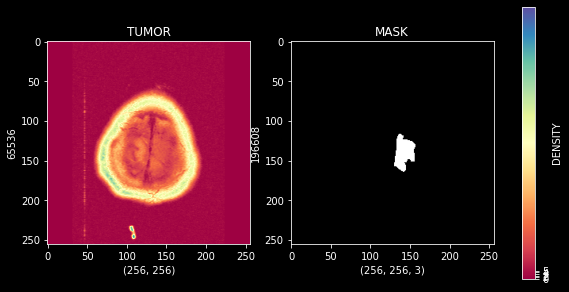

In [17]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_THREE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="Spectral")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

##### GRAY

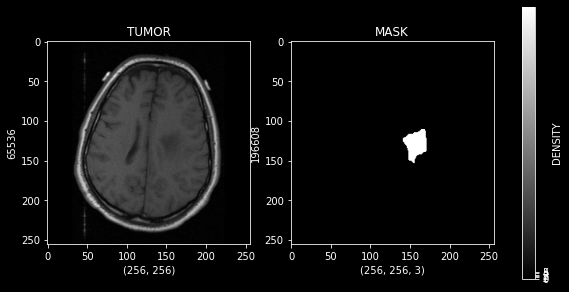

In [18]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_ONE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="gray")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

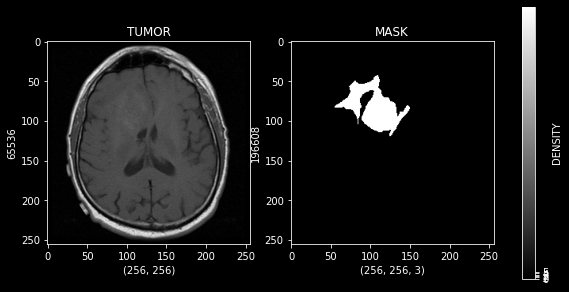

In [19]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_TWO),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="gray")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

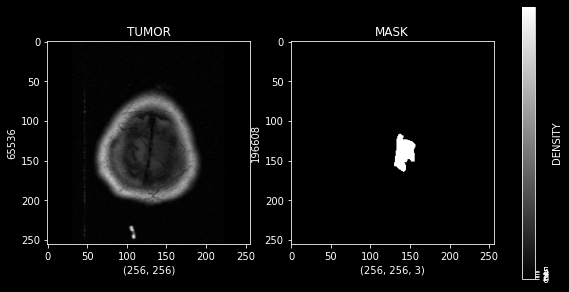

In [20]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_THREE),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap="gray")

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

#### TRANSFORMATION LAYERS

##### ORIGINAL

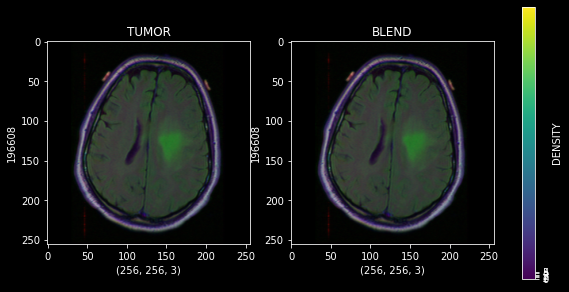

In [21]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_ONE),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Reading_Image.copy()
Copy_IMG[Example_Reading_Mask == 1] = [255,0,0]
Copy_IMG[Example_Reading_Mask == 2] = [0,255,255]
    
Copy_IMG_Two = Example_Reading_Image.copy()
Blend_Image = cv2.addWeighted(Copy_IMG,0.5,Copy_IMG_Two,0.5,0,Copy_IMG_Two)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
Example_Colorbar_Plt = axis[1].imshow(Blend_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

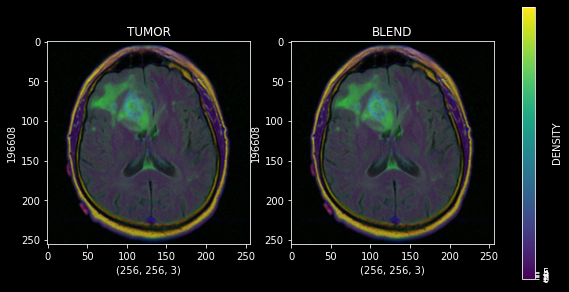

In [22]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_TWO),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Reading_Image.copy()
Copy_IMG[Example_Reading_Mask == 1] = [255,0,0]
Copy_IMG[Example_Reading_Mask == 2] = [0,255,255]
    
Copy_IMG_Two = Example_Reading_Image.copy()
Blend_Image = cv2.addWeighted(Copy_IMG,0.5,Copy_IMG_Two,0.5,0,Copy_IMG_Two)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
Example_Colorbar_Plt = axis[1].imshow(Blend_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

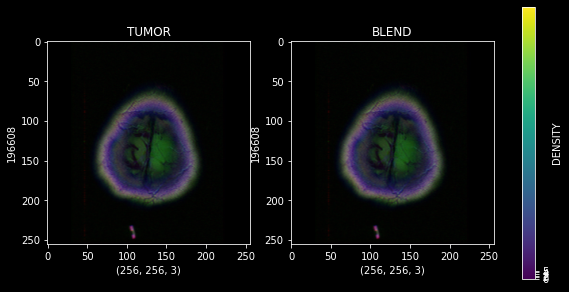

In [23]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.cvtColor(cv2.imread(Example_Mask_THREE),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Reading_Image.copy()
Copy_IMG[Example_Reading_Mask == 1] = [255,0,0]
Copy_IMG[Example_Reading_Mask == 2] = [0,255,255]
    
Copy_IMG_Two = Example_Reading_Image.copy()
Blend_Image = cv2.addWeighted(Copy_IMG,0.5,Copy_IMG_Two,0.5,0,Copy_IMG_Two)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
Example_Colorbar_Plt = axis[1].imshow(Blend_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

##### CONCAT AND 3D VISION

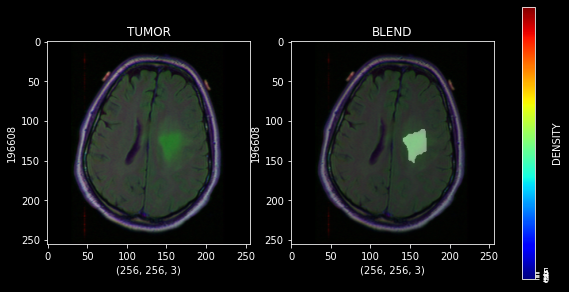

In [24]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask =cv2.imread(Example_Mask_ONE)

Blend_Image = cv2.addWeighted(Example_Reading_Image,0.8,Example_Reading_Mask,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
Example_Colorbar_Plt = axis[1].imshow(Blend_Image,cmap="jet")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

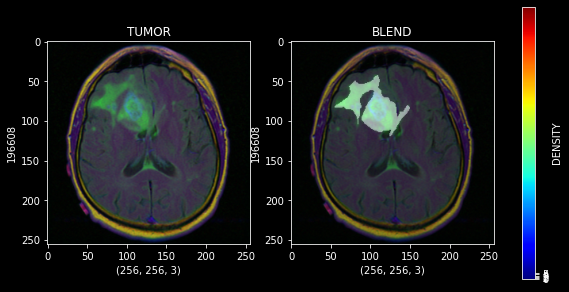

In [25]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask =cv2.imread(Example_Mask_TWO)

Blend_Image = cv2.addWeighted(Example_Reading_Image,0.8,Example_Reading_Mask,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
Example_Colorbar_Plt = axis[1].imshow(Blend_Image,cmap="jet")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

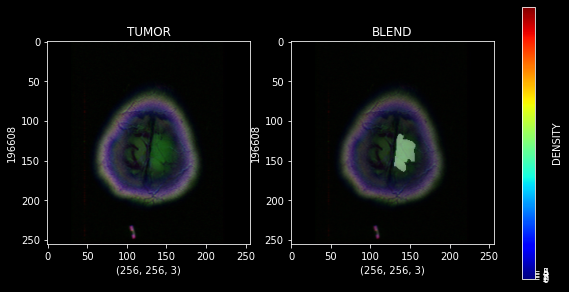

In [26]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask =cv2.imread(Example_Mask_THREE)

Blend_Image = cv2.addWeighted(Example_Reading_Image,0.8,Example_Reading_Mask,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
Example_Colorbar_Plt = axis[1].imshow(Blend_Image,cmap="jet")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

##### TRANSFORMATION AND CANNY

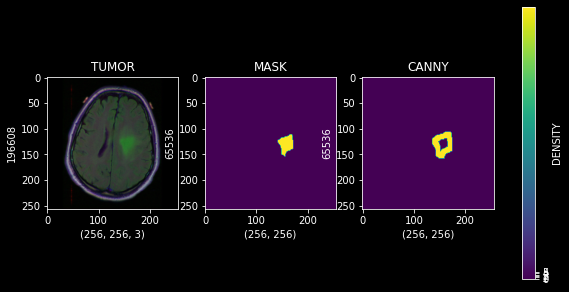

In [27]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Example_Dilation_Image.shape)
axis[2].set_ylabel(Example_Dilation_Image.size)
axis[2].set_title("CANNY")
axis[2].imshow(Example_Dilation_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

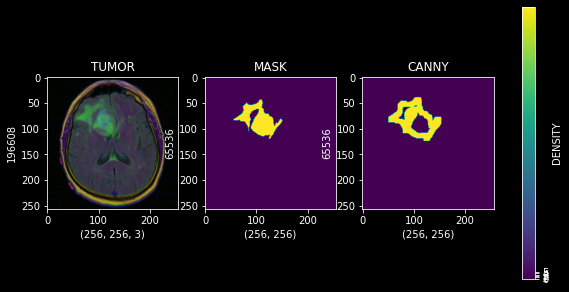

In [28]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Example_Dilation_Image.shape)
axis[2].set_ylabel(Example_Dilation_Image.size)
axis[2].set_title("CANNY")
axis[2].imshow(Example_Dilation_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

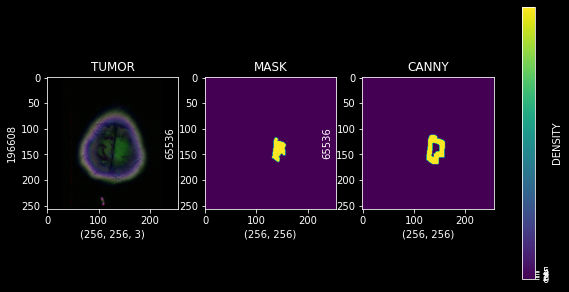

In [29]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Example_Dilation_Image.shape)
axis[2].set_ylabel(Example_Dilation_Image.size)
axis[2].set_title("CANNY")
axis[2].imshow(Example_Dilation_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

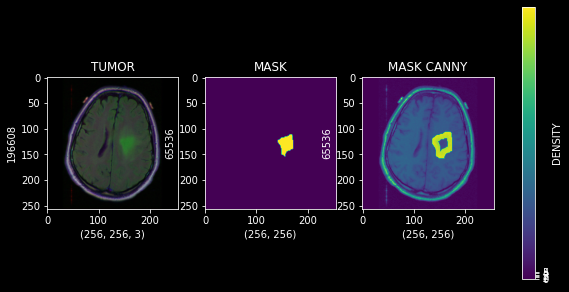

In [30]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

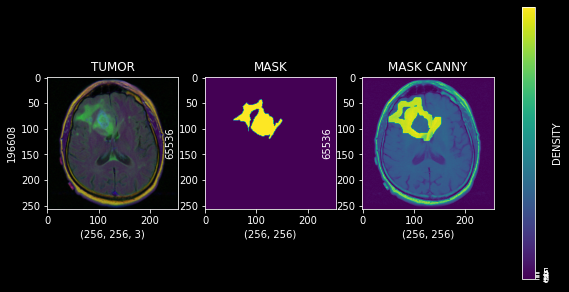

In [31]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

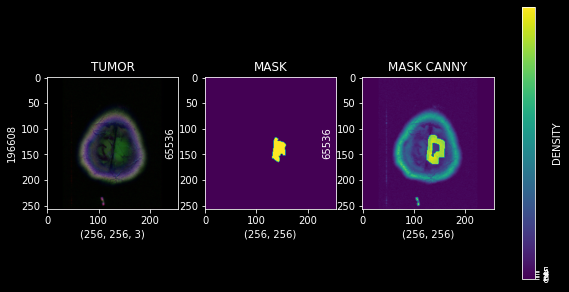

In [32]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

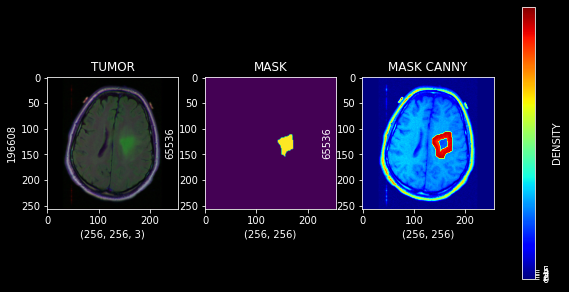

In [33]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
Example_Colorbar_Plt = axis[2].imshow(Blend_Image,cmap="jet")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

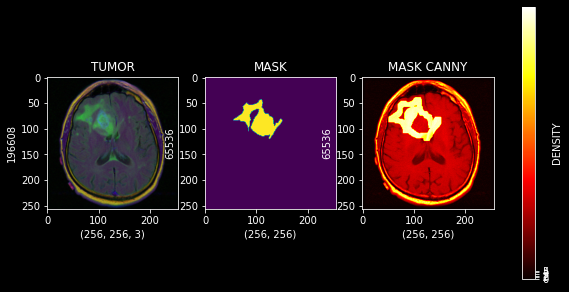

In [34]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
Example_Colorbar_Plt = axis[2].imshow(Blend_Image,cmap="hot")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

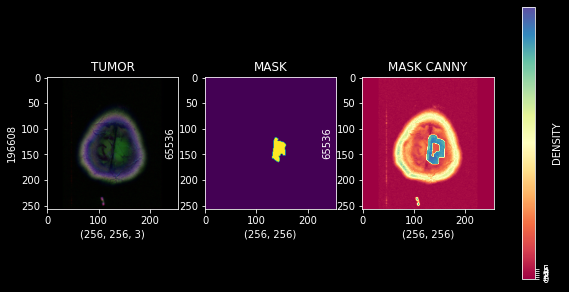

In [35]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
Example_Colorbar_Plt = axis[2].imshow(Blend_Image,cmap="Spectral")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

##### MASK HESSIAN

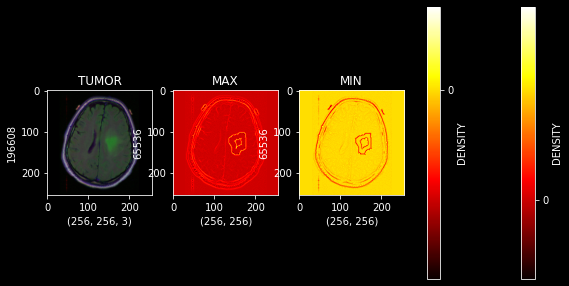

In [36]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)
Example_Hessian_Image = hessian_matrix(Blend_Image,sigma=0.5,order="rc")
Max_Ex_IMG,Min_Ex_IMG = hessian_matrix_eigvals(Example_Hessian_Image)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Max_Ex_IMG.shape)
axis[1].set_ylabel(Max_Ex_IMG.size)
axis[1].set_title("MAX")
Example_Colorbar_Plt_Two = axis[1].imshow(Max_Ex_IMG,cmap="hot")
figure.colorbar(Example_Colorbar_Plt_Two,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')


axis[2].set_xlabel(Min_Ex_IMG.shape)
axis[2].set_ylabel(Min_Ex_IMG.size)
axis[2].set_title("MIN")
Example_Colorbar_Plt = axis[2].imshow(Min_Ex_IMG,cmap="hot")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

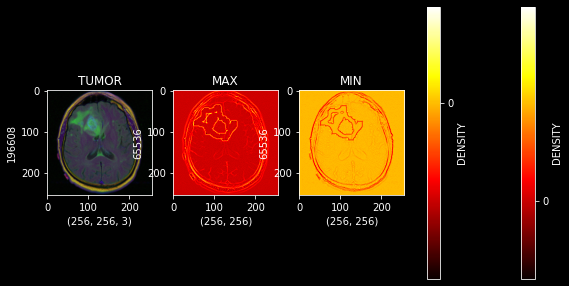

In [37]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)
Example_Hessian_Image = hessian_matrix(Blend_Image,sigma=0.5,order="rc")
Max_Ex_IMG,Min_Ex_IMG = hessian_matrix_eigvals(Example_Hessian_Image)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Max_Ex_IMG.shape)
axis[1].set_ylabel(Max_Ex_IMG.size)
axis[1].set_title("MAX")
Example_Colorbar_Plt_Two = axis[1].imshow(Max_Ex_IMG,cmap="hot")
figure.colorbar(Example_Colorbar_Plt_Two,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')


axis[2].set_xlabel(Min_Ex_IMG.shape)
axis[2].set_ylabel(Min_Ex_IMG.size)
axis[2].set_title("MIN")
Example_Colorbar_Plt = axis[2].imshow(Min_Ex_IMG,cmap="hot")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

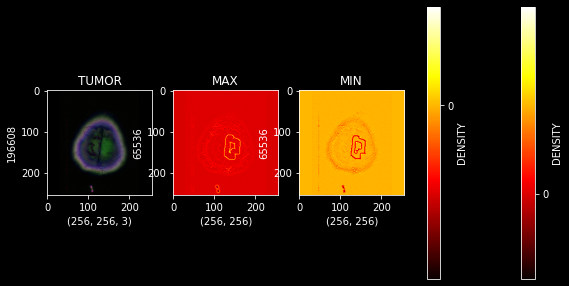

In [38]:
figure,axis = plt.subplots(1,3,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)
Example_Hessian_Image = hessian_matrix(Blend_Image,sigma=0.5,order="rc")
Max_Ex_IMG,Min_Ex_IMG = hessian_matrix_eigvals(Example_Hessian_Image)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Max_Ex_IMG.shape)
axis[1].set_ylabel(Max_Ex_IMG.size)
axis[1].set_title("MAX")
Example_Colorbar_Plt_Two = axis[1].imshow(Max_Ex_IMG,cmap="hot")
figure.colorbar(Example_Colorbar_Plt_Two,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')


axis[2].set_xlabel(Min_Ex_IMG.shape)
axis[2].set_ylabel(Min_Ex_IMG.size)
axis[2].set_title("MIN")
Example_Colorbar_Plt = axis[2].imshow(Min_Ex_IMG,cmap="hot")

figure.colorbar(Example_Colorbar_Plt,
                ax=axis.ravel().tolist(),
                shrink=0.5,
                ticks=range(6),
                label='DENSITY')

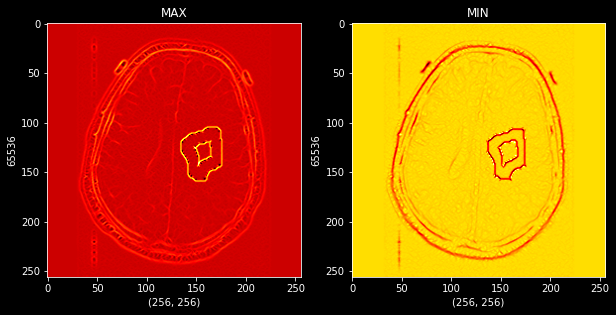

In [39]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)
Example_Hessian_Image = hessian_matrix(Blend_Image,sigma=0.5,order="rc")
Max_Ex_IMG,Min_Ex_IMG = hessian_matrix_eigvals(Example_Hessian_Image)


axis[0].set_xlabel(Max_Ex_IMG.shape)
axis[0].set_ylabel(Max_Ex_IMG.size)
axis[0].set_title("MAX")
axis[0].imshow(Max_Ex_IMG,cmap="hot")


axis[1].set_xlabel(Min_Ex_IMG.shape)
axis[1].set_ylabel(Min_Ex_IMG.size)
axis[1].set_title("MIN")
axis[1].imshow(Min_Ex_IMG,cmap="hot")

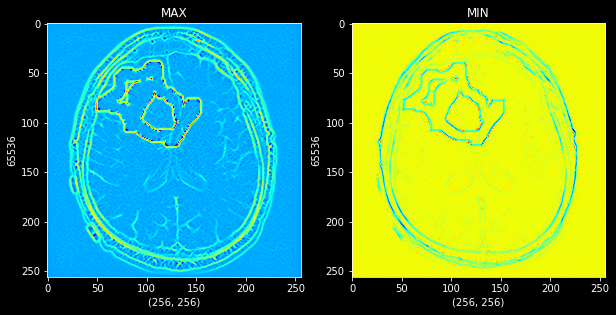

In [40]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)
Example_Hessian_Image = hessian_matrix(Blend_Image,sigma=0.5,order="rc")
Max_Ex_IMG,Min_Ex_IMG = hessian_matrix_eigvals(Example_Hessian_Image)


axis[0].set_xlabel(Max_Ex_IMG.shape)
axis[0].set_ylabel(Max_Ex_IMG.size)
axis[0].set_title("MAX")
axis[0].imshow(Max_Ex_IMG,cmap="jet")


axis[1].set_xlabel(Min_Ex_IMG.shape)
axis[1].set_ylabel(Min_Ex_IMG.size)
axis[1].set_title("MIN")
axis[1].imshow(Min_Ex_IMG,cmap="jet")

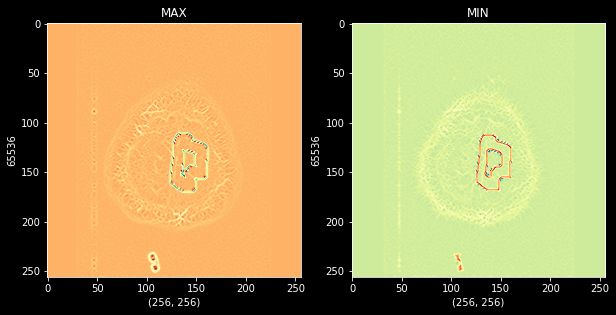

In [41]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)
Example_Hessian_Image = hessian_matrix(Blend_Image,sigma=0.5,order="rc")
Max_Ex_IMG,Min_Ex_IMG = hessian_matrix_eigvals(Example_Hessian_Image)


axis[0].set_xlabel(Max_Ex_IMG.shape)
axis[0].set_ylabel(Max_Ex_IMG.size)
axis[0].set_title("MAX")
axis[0].imshow(Max_Ex_IMG,cmap="Spectral")


axis[1].set_xlabel(Min_Ex_IMG.shape)
axis[1].set_ylabel(Min_Ex_IMG.size)
axis[1].set_title("MIN")
axis[1].imshow(Min_Ex_IMG,cmap="Spectral")

#### DETECTION KEYPOINT AND CENTER

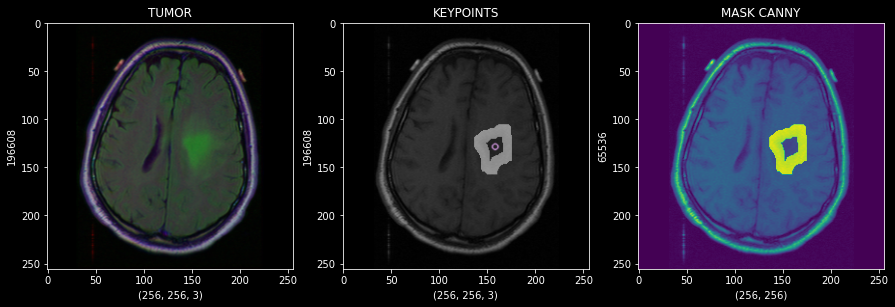

In [42]:
figure,axis = plt.subplots(1,3,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

sift_function  = cv2.SIFT_create()
keypoints,descriptors = sift_function.detectAndCompute(Example_Canny_Image,None)

Example_Keypoints = cv2.drawKeypoints(Blend_Image,keypoints,Blend_Image)


axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Keypoints.shape)
axis[1].set_ylabel(Example_Keypoints.size)
axis[1].set_title("KEYPOINTS")
axis[1].imshow(Example_Keypoints)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

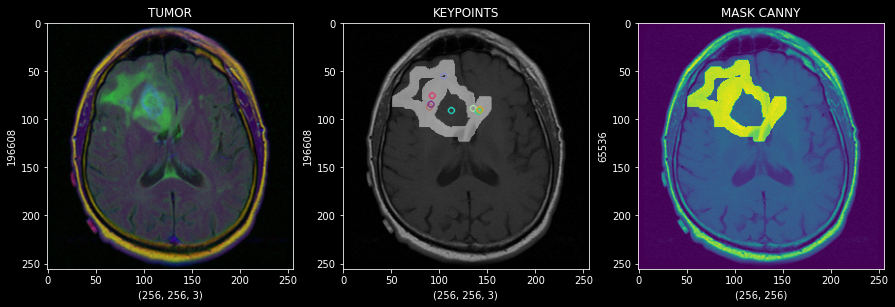

In [43]:
figure,axis = plt.subplots(1,3,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

sift_function  = cv2.SIFT_create()
keypoints,descriptors = sift_function.detectAndCompute(Example_Canny_Image,None)
Example_Keypoints = cv2.drawKeypoints(Blend_Image,keypoints,Blend_Image)


axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Keypoints.shape)
axis[1].set_ylabel(Example_Keypoints.size)
axis[1].set_title("KEYPOINTS")
axis[1].imshow(Example_Keypoints)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

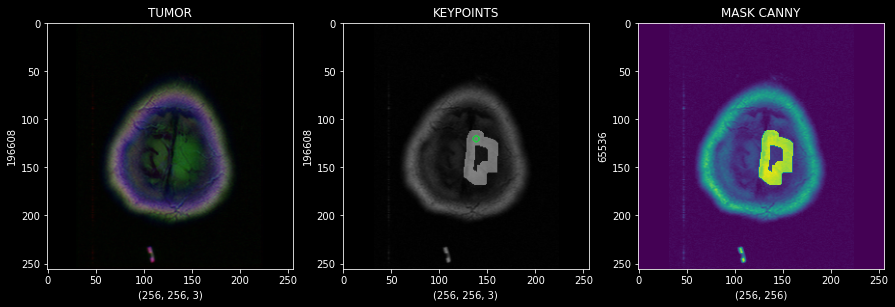

In [44]:
figure,axis = plt.subplots(1,3,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

sift_function  = cv2.SIFT_create()
keypoints,descriptors = sift_function.detectAndCompute(Example_Canny_Image,None)
Example_Keypoints = cv2.drawKeypoints(Blend_Image,keypoints,Blend_Image)


axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Keypoints.shape)
axis[1].set_ylabel(Example_Keypoints.size)
axis[1].set_title("KEYPOINTS")
axis[1].imshow(Example_Keypoints)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

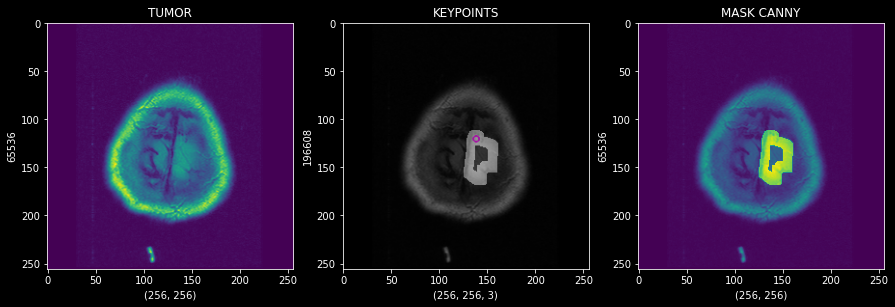

In [45]:
figure,axis = plt.subplots(1,3,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2GRAY)
Copy_Image = Example_Reading_Image.copy()
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

w_ex, h_ex = Example_Dilation_Image.shape[::-1]

method = 'cv2.TM_CCOEFF_NORMED'


Example_Reading_Image = Copy_Image.copy()
method = eval(method)
    
res_ex = cv2.matchTemplate(Example_Reading_Image,Example_Dilation_Image,method)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res_ex)

bottom_right = (min_loc[0] + w_ex, max_loc[1] + h_ex)
cv2.rectangle(Example_Reading_Image,min_loc, bottom_right,(0,0,255), 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image,0.8,Example_Dilation_Image,0.4,0.5)

sift_function  = cv2.SIFT_create()
keypoints,descriptors = sift_function.detectAndCompute(Example_Canny_Image,None)
Example_Keypoints = cv2.drawKeypoints(Blend_Image,keypoints,Blend_Image)


axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Keypoints.shape)
axis[1].set_ylabel(Example_Keypoints.size)
axis[1].set_title("KEYPOINTS")
axis[1].imshow(Example_Keypoints)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

#### SKELETON VISION

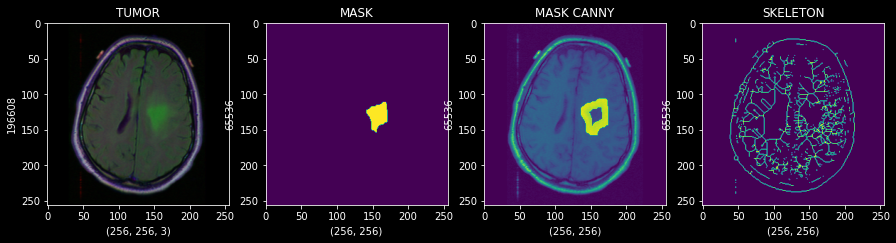

In [46]:
figure,axis = plt.subplots(1,4,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)


Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

_,Threshold_Image= cv2.threshold(Example_Reading_Image[:,:,0],50,255,cv2.THRESH_TOZERO_INV)
Array_Image = np.array(Example_Reading_Image[:,:,0] > Threshold_Image).astype(int)
Example_Skeleton_Image = skimage.morphology.skeletonize(Array_Image)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

axis[3].set_xlabel(Example_Skeleton_Image.shape)
axis[3].set_ylabel(Example_Skeleton_Image.size)
axis[3].set_title("SKELETON")
axis[3].imshow(Example_Skeleton_Image)

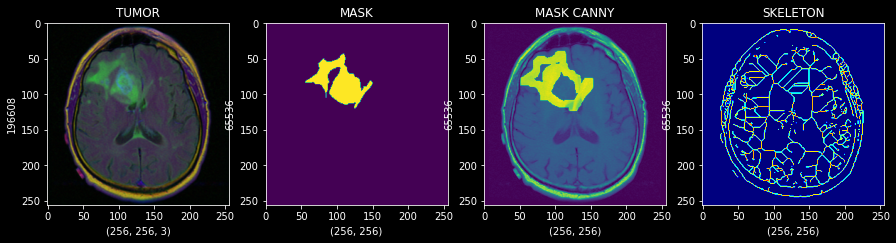

In [47]:
figure,axis = plt.subplots(1,4,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)


Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

_,Threshold_Image= cv2.threshold(Example_Reading_Image[:,:,0],50,255,cv2.THRESH_TOZERO_INV)
Array_Image = np.array(Example_Reading_Image[:,:,0] > Threshold_Image).astype(int)
Example_Skeleton_Image = skimage.morphology.skeletonize(Array_Image)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

axis[3].set_xlabel(Example_Skeleton_Image.shape)
axis[3].set_ylabel(Example_Skeleton_Image.size)
axis[3].set_title("SKELETON")
axis[3].imshow(Example_Skeleton_Image,cmap="jet")

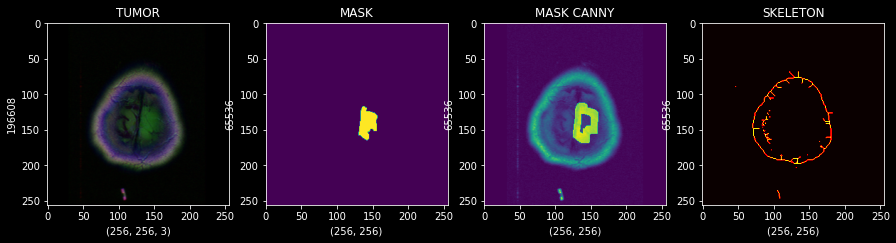

In [48]:
figure,axis = plt.subplots(1,4,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)


Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

_,Threshold_Image= cv2.threshold(Example_Reading_Image[:,:,0],50,255,cv2.THRESH_TOZERO_INV)
Array_Image = np.array(Example_Reading_Image[:,:,0] > Threshold_Image).astype(int)
Example_Skeleton_Image = skimage.morphology.skeletonize(Array_Image)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

axis[3].set_xlabel(Example_Skeleton_Image.shape)
axis[3].set_ylabel(Example_Skeleton_Image.size)
axis[3].set_title("SKELETON")
axis[3].imshow(Example_Skeleton_Image,cmap="hot")

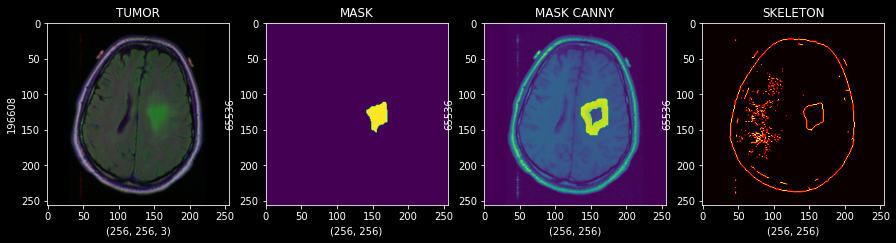

In [49]:
figure,axis = plt.subplots(1,4,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_ONE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_ONE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)


Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

_,Threshold_Blend= cv2.threshold(Blend_Image,50,255,cv2.THRESH_TOZERO_INV)
Array_Image = np.array(Blend_Image > Threshold_Blend).astype(int)
Example_Skeleton_Image = skimage.morphology.skeletonize(Array_Image)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

axis[3].set_xlabel(Example_Skeleton_Image.shape)
axis[3].set_ylabel(Example_Skeleton_Image.size)
axis[3].set_title("SKELETON")
axis[3].imshow(Example_Skeleton_Image,cmap="hot")

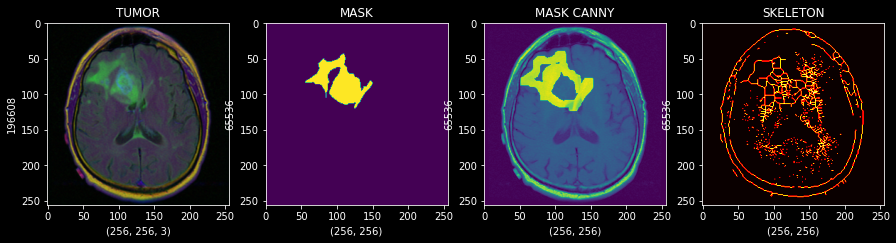

In [50]:
figure,axis = plt.subplots(1,4,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_TWO),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_TWO,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)


Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

_,Threshold_Blend= cv2.threshold(Blend_Image,50,255,cv2.THRESH_TOZERO_INV)
Array_Image = np.array(Blend_Image > Threshold_Blend).astype(int)
Example_Skeleton_Image = skimage.morphology.skeletonize(Array_Image)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

axis[3].set_xlabel(Example_Skeleton_Image.shape)
axis[3].set_ylabel(Example_Skeleton_Image.size)
axis[3].set_title("SKELETON")
axis[3].imshow(Example_Skeleton_Image,cmap="hot")

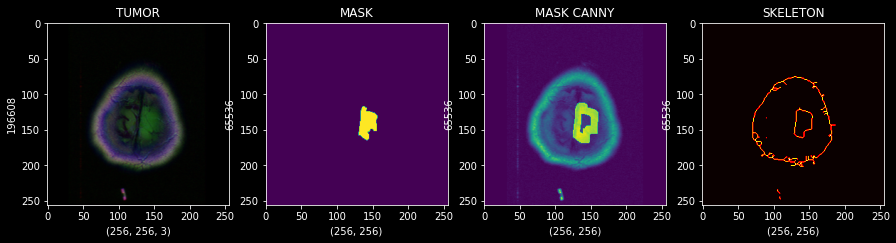

In [51]:
figure,axis = plt.subplots(1,4,figsize=(15,15))

Example_Reading_Image = cv2.cvtColor(cv2.imread(Example_Image_THREE),cv2.COLOR_BGR2RGB)
Example_Reading_Mask = cv2.imread(Example_Mask_THREE,cv2.IMREAD_GRAYSCALE)
Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)


Example_Kernel = np.ones((5,5),np.uint8)
Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

_,Threshold_Blend= cv2.threshold(Blend_Image,50,255,cv2.THRESH_TOZERO_INV)
Array_Image = np.array(Blend_Image > Threshold_Blend).astype(int)
Example_Skeleton_Image = skimage.morphology.skeletonize(Array_Image)

axis[0].set_xlabel(Example_Reading_Image.shape)
axis[0].set_ylabel(Example_Reading_Image.size)
axis[0].set_title("TUMOR")
axis[0].imshow(Example_Reading_Image)

axis[1].set_xlabel(Example_Reading_Mask.shape)
axis[1].set_ylabel(Example_Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Reading_Mask)


axis[2].set_xlabel(Blend_Image.shape)
axis[2].set_ylabel(Blend_Image.size)
axis[2].set_title("MASK CANNY")
axis[2].imshow(Blend_Image)

axis[3].set_xlabel(Example_Skeleton_Image.shape)
axis[3].set_ylabel(Example_Skeleton_Image.size)
axis[3].set_title("SKELETON")
axis[3].imshow(Example_Skeleton_Image,cmap="hot")

# MAIN PROCESS

#### MAIN PATH

In [52]:
Main_Path = Path("../input/lgg-mri-segmentation/kaggle_3m")

#### TIF PATH

In [53]:
Tif_Path = list(Main_Path.glob(r"*/*.tif"))

In [54]:
print(len(Tif_Path))

7858


#### MASK AND IMAGE

In [55]:
Common_Series = pd.Series(Tif_Path,name="GENERAL").astype(str)

In [56]:
Image_Series = pd.Series(Common_Series[~Common_Series.str.contains("mask")]) # have not "mask"

In [57]:
Mask_Series = pd.Series(Common_Series[Common_Series.str.contains("mask")]) # have "mask"

In [58]:
print(len(Image_Series))
print(len(Mask_Series))

3929
3929


In [59]:
Image_Series = Image_Series.reset_index(drop=True)
Mask_Series = Mask_Series.reset_index(drop=True)

In [60]:
print(Image_Series.head(-1))

0       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
1       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
2       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
4       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
                              ...                        
3923    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3924    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3925    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3926    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3927    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
Name: GENERAL, Length: 3928, dtype: object


In [61]:
print(Mask_Series.head(-1))

0       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
1       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
2       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
4       ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
                              ...                        
3923    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3924    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3925    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3926    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3927    ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...
Name: GENERAL, Length: 3928, dtype: object


In [62]:
print(Image_Series[4])
print(Image_Series[40])
print(Image_Series[400])
print(Image_Series[234])
print(Image_Series[441])

../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_52.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_54.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_FG_6691_20020405/TCGA_FG_6691_20020405_21.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_34.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7684_19950816/TCGA_HT_7684_19950816_21.tif


In [63]:
print(Mask_Series[4])
print(Mask_Series[40])
print(Mask_Series[400])
print(Mask_Series[234])
print(Mask_Series[441])

../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_43_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_12_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_FG_6691_20020405/TCGA_FG_6691_20020405_25_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_6_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7684_19950816/TCGA_HT_7684_19950816_16_mask.tif


In [64]:
print(len("../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_"))
print(len(".tif"))
print(len("_mask.tif"))

84
4
9


In [65]:
Main_LEN = len("../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_")
IMG_EndPath_LEN = len(".tif") 
MASK_EndPath_LEN = len("_mask.tif")

Image_Series = sorted(Image_Series.values,key=lambda x : int(x[Main_LEN:-IMG_EndPath_LEN]))
Mask_Series = sorted(Mask_Series.values,key=lambda x : int(x[Main_LEN:-MASK_EndPath_LEN]))

In [66]:
print(Image_Series[4])
print(Image_Series[40])
print(Image_Series[400])
print(Image_Series[234])
print(Image_Series[441])

../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TS_19970726/TCGA_DU_A5TS_19970726_1.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6400_19830518/TCGA_DU_6400_19830518_1.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7855_19951020/TCGA_HT_7855_19951020_4.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_3.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_8162_19961029/TCGA_DU_8162_19961029_5.tif


In [67]:
print(Mask_Series[4])
print(Mask_Series[40])
print(Mask_Series[400])
print(Mask_Series[234])
print(Mask_Series[441])

../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TS_19970726/TCGA_DU_A5TS_19970726_1_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6400_19830518/TCGA_DU_6400_19830518_1_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7855_19951020/TCGA_HT_7855_19951020_4_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_3_mask.tif
../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_8162_19961029/TCGA_DU_8162_19961029_5_mask.tif


In [68]:
print(type(Image_Series))
print(type(Mask_Series))

<class 'list'>
<class 'list'>


In [69]:
Main_Data = {"IMAGE":Image_Series,"MASK":Mask_Series}
Main_Data = pd.DataFrame(Main_Data)

In [70]:
print(Main_Data.head(-1))

                                                  IMAGE  \
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
3     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
4     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
...                                                 ...   
3923  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3924  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3925  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3926  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3927  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   

                                                   MASK  
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...  
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...  
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...  
3     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...  
4

In [71]:
print(Main_Data.columns)

Index(['IMAGE', 'MASK'], dtype='object')


#### CHECKING

9.922027587890625


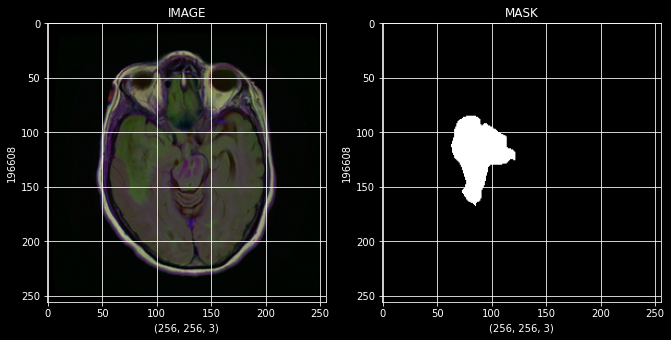

In [72]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1555]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(Main_Data["MASK"][1555])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)
axis[0].grid()

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)
axis[1].grid()

print(np.mean(Reading_Mask))

# focus on mean of pixels of MASK

0.0


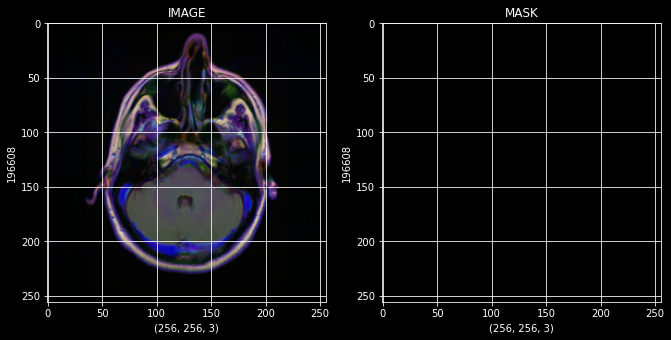

In [73]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][555]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(Main_Data["MASK"][555])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)
axis[0].grid()

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)
axis[1].grid()


print(np.mean(Reading_Mask))

# focus on mean of pixels of MASK

0.0


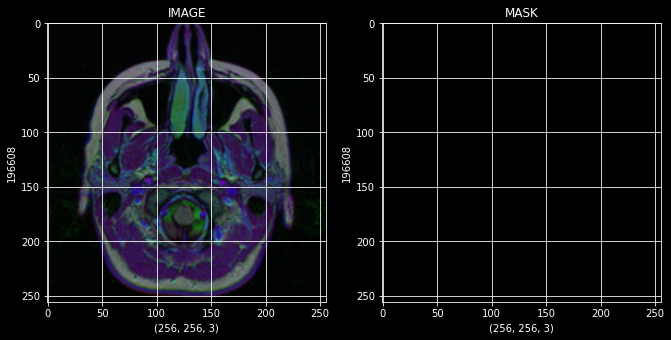

In [74]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][2]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(Main_Data["MASK"][2])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)
axis[0].grid()

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)
axis[1].grid()

print(np.mean(Reading_Mask))

# focus on mean of pixels of MASK

21.054153442382812


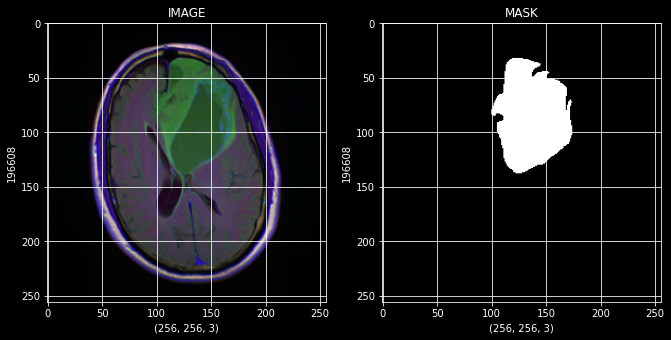

In [75]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1660]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(Main_Data["MASK"][1660])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)
axis[0].grid()

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)
axis[1].grid()

print(np.mean(Reading_Mask))

# focus on mean of pixels of MASK

#### CREATING NEW COLUMN FOR MASKS

In [76]:
Mask_1_0 = []

for mask_index in range(len(Main_Data["MASK"])):
    
    Image_Picking = cv2.imread(Main_Data["MASK"][mask_index])
    Mean_Result = np.mean(Image_Picking)
    
    if Mean_Result > 0:
        Mask_1_0.append(1) # tumor
    else:
        Mask_1_0.append(0) # no tumor

In [77]:
print(len(Mask_1_0))

3929


In [78]:
Main_Data["1_OR_0"] = Mask_1_0

In [79]:
print(Main_Data.columns)

Index(['IMAGE', 'MASK', '1_OR_0'], dtype='object')


In [80]:
print(Main_Data.head(-1))

                                                  IMAGE  \
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
3     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
4     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
...                                                 ...   
3923  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3924  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3925  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3926  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3927  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   

                                                   MASK  1_OR_0  
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...       0  
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...       0  
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...       0  
3     ../input/lgg-mri-segm

In [81]:
print(Main_Data.isnull().sum())

IMAGE     0
MASK      0
1_OR_0    0
dtype: int64


#### CHECKING AGAIN

In [82]:
MASK_1_True = Main_Data[Main_Data["1_OR_0"] == 1] # there is tumor
MASK_0_True = Main_Data[Main_Data["1_OR_0"] == 0] # there is no tumor

In [83]:
MASK_1_True = MASK_1_True.reset_index(drop=True)
MASK_0_True = MASK_0_True.reset_index(drop=True)

print(len(MASK_1_True))
print(len(MASK_0_True))

1373
2556


In [84]:
print(MASK_1_True.head(-1))

                                                  IMAGE  \
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_C...   
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
3     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_C...   
4     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
...                                                 ...   
1367  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
1368  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
1369  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
1370  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
1371  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   

                                                   MASK  1_OR_0  
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_C...       1  
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...       1  
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...       1  
3     ../input/lgg-mri-segm

In [85]:
print(MASK_0_True.head(-1))

                                                  IMAGE  \
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
3     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...   
4     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...   
...                                                 ...   
2550  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
2551  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
2552  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
2553  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   
2554  ../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...   

                                                   MASK  1_OR_0  
0     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...       0  
1     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...       0  
2     ../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...       0  
3     ../input/lgg-mri-segm

7.51739501953125


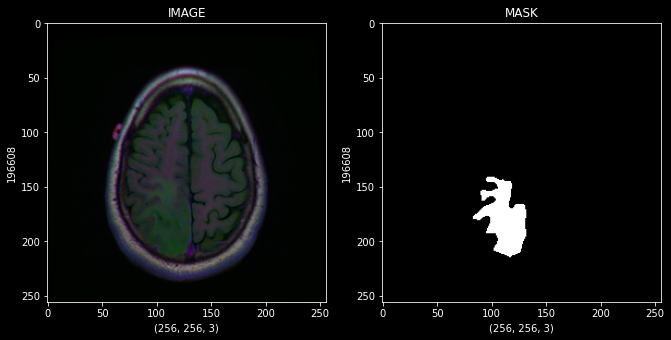

In [86]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(MASK_1_True["IMAGE"][1060]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(MASK_1_True["MASK"][1060])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)

print(np.mean(Reading_Mask))

0.0


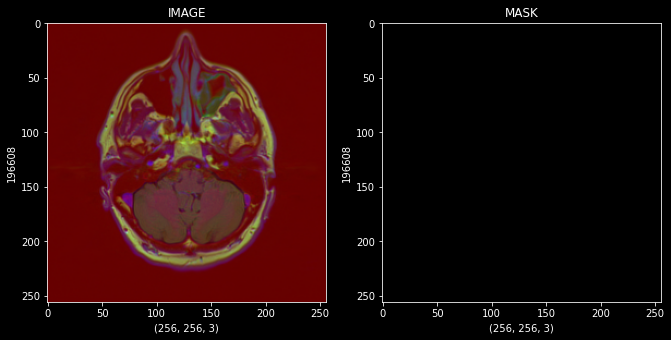

In [87]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(MASK_0_True["IMAGE"][1060]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(MASK_0_True["MASK"][1060])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)

print(np.mean(Reading_Mask))

24.081344604492188


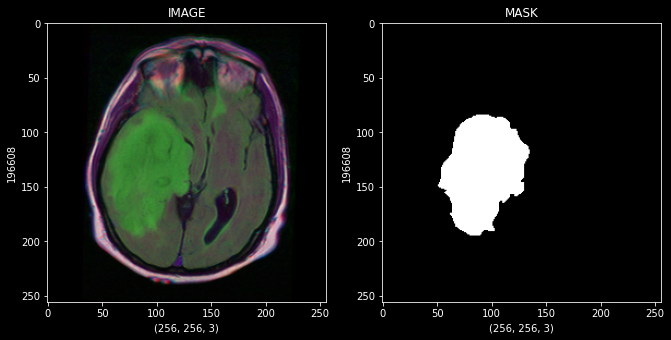

In [88]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(MASK_1_True["IMAGE"][60]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(MASK_1_True["MASK"][60])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)

print(np.mean(Reading_Mask))

0.0


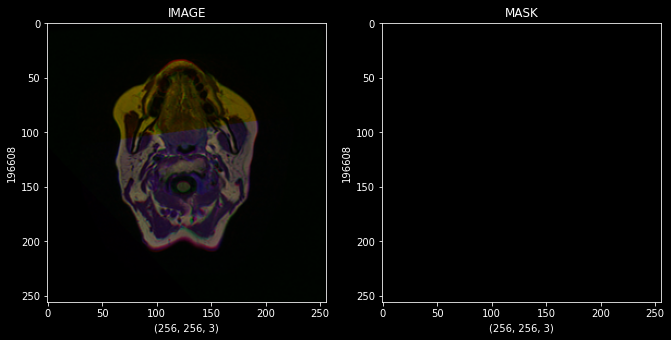

In [89]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(MASK_0_True["IMAGE"][1]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(MASK_0_True["MASK"][1])

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)

axis[1].set_xlabel(Reading_Mask.shape)
axis[1].set_ylabel(Reading_Mask.size)
axis[1].set_title("MASK")
axis[1].imshow(Reading_Mask)

print(np.mean(Reading_Mask))

#### TRANSFORMATION FUNCTION

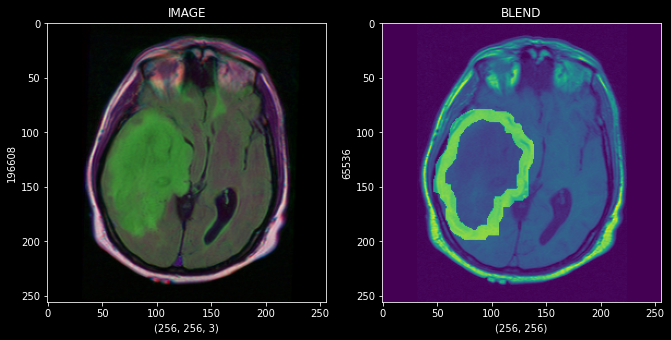

In [90]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(MASK_1_True["IMAGE"][60]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(MASK_1_True["MASK"][60],cv2.IMREAD_GRAYSCALE)
Canny_Image = cv2.Canny(Reading_Mask,10,100)

NP_Kernel = np.ones((5,5),np.uint8)
Dilation_Image = cv2.dilate(Canny_Image,NP_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Reading_Image[:,:,0],0.8,Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
axis[1].imshow(Blend_Image)

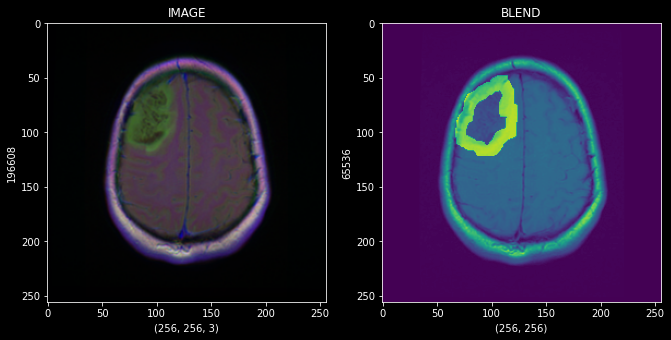

In [91]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(MASK_1_True["IMAGE"][600]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(MASK_1_True["MASK"][600],cv2.IMREAD_GRAYSCALE)
Canny_Image = cv2.Canny(Reading_Mask,10,100)

NP_Kernel = np.ones((5,5),np.uint8)
Dilation_Image = cv2.dilate(Canny_Image,NP_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Reading_Image[:,:,0],0.8,Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
axis[1].imshow(Blend_Image)

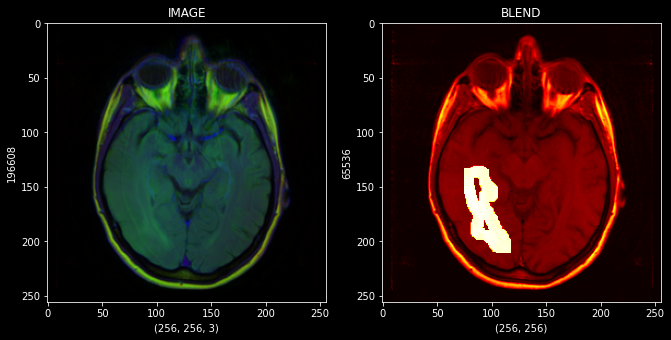

In [92]:
figure,axis = plt.subplots(1,2,figsize=(11,11))

Reading_Image = cv2.cvtColor(cv2.imread(MASK_1_True["IMAGE"][100]),cv2.COLOR_BGR2RGB)
Reading_Mask = cv2.imread(MASK_1_True["MASK"][100],cv2.IMREAD_GRAYSCALE)
Canny_Image = cv2.Canny(Reading_Mask,10,100)

NP_Kernel = np.ones((5,5),np.uint8)
Dilation_Image = cv2.dilate(Canny_Image,NP_Kernel,iterations = 2)

Blend_Image = cv2.addWeighted(Reading_Image[:,:,0],0.8,Dilation_Image,0.4,0.5)

axis[0].set_xlabel(Reading_Image.shape)
axis[0].set_ylabel(Reading_Image.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Reading_Image)

axis[1].set_xlabel(Blend_Image.shape)
axis[1].set_ylabel(Blend_Image.size)
axis[1].set_title("BLEND")
axis[1].imshow(Blend_Image,cmap="hot")

In [93]:
def transformation_for_tensors(image_x,mask_x):
    
    NP_Kernel = np.ones((5,5),np.uint8)
    
    Reading_Image = cv2.cvtColor(cv2.imread(image_x),cv2.COLOR_BGR2RGB)
    Reading_Mask = cv2.imread(mask_x,cv2.IMREAD_GRAYSCALE)
    

    Copy_Main = Reading_Image.copy()
    Copy_Main[Reading_Mask == 255] = (255,255,0)
    
    Copy_Main_Two = Reading_Image.copy()
    Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)
    
    return Blend_Image

# DATA TRANSFORMATION I

In [94]:
Image_List = []
Transformation_List = []

for image_x,mask_x in zip(MASK_1_True.IMAGE.values,MASK_1_True.MASK.values):
    
    Reading_Image = cv2.cvtColor(cv2.imread(image_x),cv2.COLOR_BGR2RGB)
    Transformation_Image = transformation_for_tensors(image_x,mask_x)
    
    Resized_Image = cv2.resize(Reading_Image,(180,180))
    Resized_Transformation = cv2.resize(Transformation_Image,(180,180))
    
    Image_List.append(Resized_Image)
    Transformation_List.append(Resized_Transformation)

In [95]:
print(len(Image_List))
print(len(Transformation_List))

1373
1373


In [96]:
print("WHEN IT IS ARRAY IMAGE SHAPE: ",np.shape(np.array(Image_List)))
print("WHEN IT IS ARRAY MASK SHAPE: ",np.shape(np.array(Transformation_List)))

WHEN IT IS ARRAY IMAGE SHAPE:  (1373, 180, 180, 3)
WHEN IT IS ARRAY MASK SHAPE:  (1373, 180, 180, 3)


Text(0.5, 1.0, 'ORIGINAL')

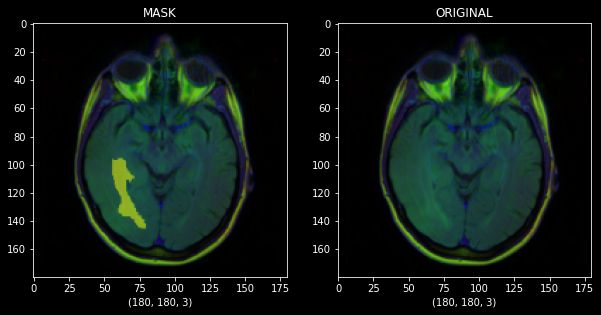

In [97]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[100])
axis[0].set_xlabel(Transformation_List[100].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[100])
axis[1].set_xlabel(Image_List[100].shape)
axis[1].set_title("ORIGINAL")

Text(0.5, 1.0, 'ORIGINAL')

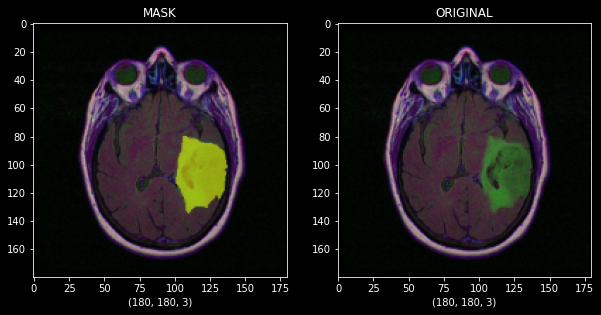

In [98]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[1000],cmap="hot")
axis[0].set_xlabel(Transformation_List[1000].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[1000])
axis[1].set_xlabel(Image_List[1000].shape)
axis[1].set_title("ORIGINAL")

Text(0.5, 1.0, 'ORIGINAL')

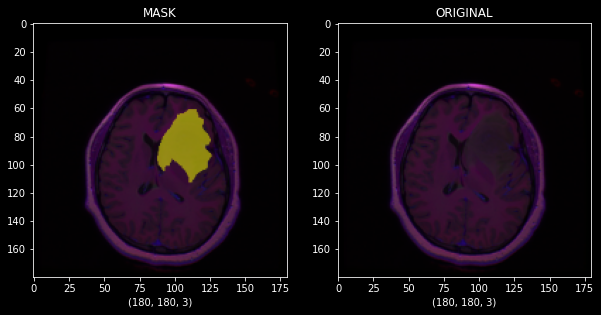

In [99]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[1300],cmap="Spectral")
axis[0].set_xlabel(Transformation_List[1300].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[1300])
axis[1].set_xlabel(Image_List[1300].shape)
axis[1].set_title("ORIGINAL")

#### TO ARRAY

In [100]:
Train_Set = np.array(Image_List,dtype="float32")
Transformation_Set = np.array(Transformation_List,dtype="float32")

Train_Set = Train_Set / 255.
Transformation_Set = Transformation_Set / 255.

In [101]:
print("TRAIN SHAPE: ",Train_Set.shape)
print("TRANSFORMATION SHAPE: ",Transformation_Set.shape)

TRAIN SHAPE:  (1373, 180, 180, 3)
TRANSFORMATION SHAPE:  (1373, 180, 180, 3)


In [102]:
print("TRAIN REDUCE SHAPE: ",Train_Set[:1350].shape)
print("TRANSFORMATION REDUCE SHAPE: ",Transformation_Set[:1350].shape)

TRAIN REDUCE SHAPE:  (1350, 180, 180, 3)
TRANSFORMATION REDUCE SHAPE:  (1350, 180, 180, 3)


Text(0.5, 1.0, 'ORIGINAL IMAGE SET')

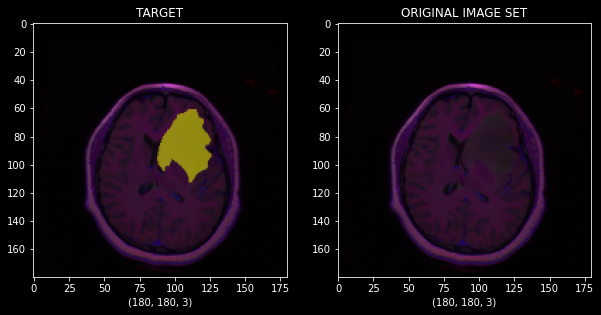

In [103]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_Set[1300])
axis[0].set_xlabel(Transformation_Set[1300].shape)
axis[0].set_title("TARGET")
axis[1].imshow(Train_Set[1300])
axis[1].set_xlabel(Train_Set[1300].shape)
axis[1].set_title("ORIGINAL IMAGE SET")

# DATA TRANSFORMATION II

In [104]:
Image_List_B = []
Transformation_List_B = []

for image_x,mask_x in zip(MASK_1_True.IMAGE.values,MASK_1_True.MASK.values):
    
    Reading_Image = cv2.cvtColor(cv2.imread(image_x),cv2.COLOR_BGR2RGB)
    Reading_Mask =cv2.imread(mask_x)
    Blend_Image = cv2.addWeighted(Reading_Image,0.8,Reading_Mask,0.4,0.5)
    Blend_Image_2D = Blend_Image[:,:,0]
    
    Resized_Image = cv2.resize(Reading_Image,(180,180))
    Resized_Blend = cv2.resize(Blend_Image_2D,(180,180))
    
    
    Image_List_B.append(Resized_Image)
    Transformation_List_B.append(Resized_Blend)

In [105]:
print(len(Image_List_B))
print(len(Transformation_List_B))

1373
1373


In [106]:
print("WHEN IT IS ARRAY IMAGE SHAPE: ",np.shape(np.array(Image_List_B)))
print("WHEN IT IS ARRAY MASK SHAPE: ",np.shape(np.array(Transformation_List_B)))

WHEN IT IS ARRAY IMAGE SHAPE:  (1373, 180, 180, 3)
WHEN IT IS ARRAY MASK SHAPE:  (1373, 180, 180)


Text(0.5, 1.0, 'ORIGINAL')

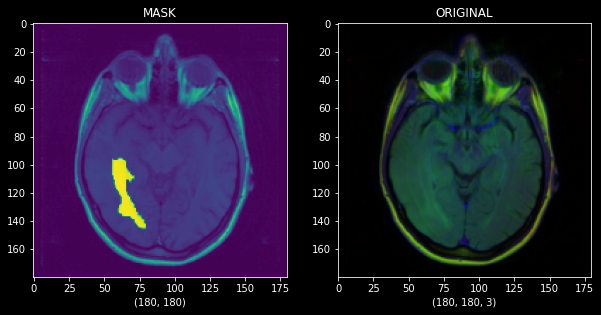

In [107]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List_B[100])
axis[0].set_xlabel(Transformation_List_B[100].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List_B[100])
axis[1].set_xlabel(Image_List_B[100].shape)
axis[1].set_title("ORIGINAL")

Text(0.5, 1.0, 'ORIGINAL')

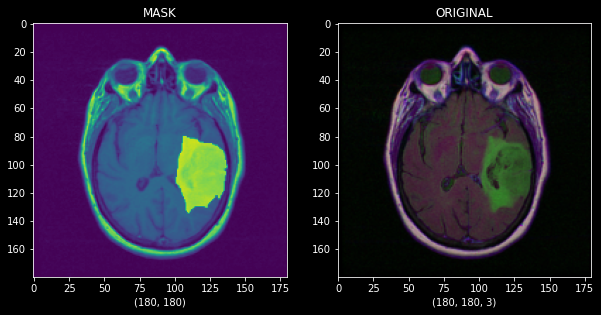

In [108]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List_B[1000])
axis[0].set_xlabel(Transformation_List_B[1000].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List_B[1000])
axis[1].set_xlabel(Image_List_B[1000].shape)
axis[1].set_title("ORIGINAL")

Text(0.5, 1.0, 'ORIGINAL')

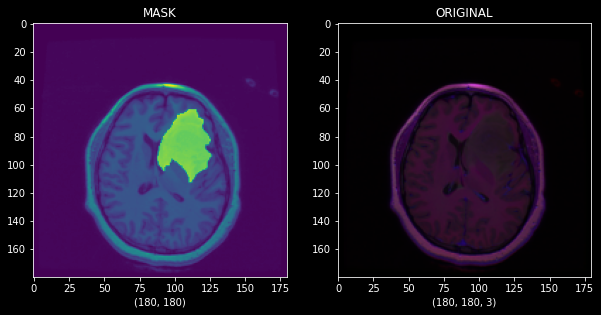

In [109]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List_B[1300])
axis[0].set_xlabel(Transformation_List_B[1300].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List_B[1300])
axis[1].set_xlabel(Image_List_B[1300].shape)
axis[1].set_title("ORIGINAL")

In [110]:
Train_Set_B = np.array(Image_List_B,dtype="float32")
Transformation_Set_B = np.array(Transformation_List_B,dtype="float32")

Train_Set_B = Train_Set_B / 255.
Transformation_Set_B = Transformation_Set_B / 255.

Text(0.5, 1.0, 'ORIGINAL IMAGE SET')

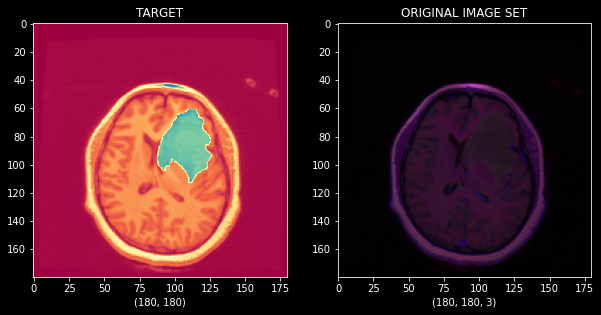

In [111]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_Set_B[1300],cmap="Spectral")
axis[0].set_xlabel(Transformation_Set_B[1300].shape)
axis[0].set_title("TARGET")
axis[1].imshow(Train_Set_B[1300])
axis[1].set_xlabel(Train_Set_B[1300].shape)
axis[1].set_title("ORIGINAL IMAGE SET")

Text(0.5, 1.0, 'ORIGINAL IMAGE SET')

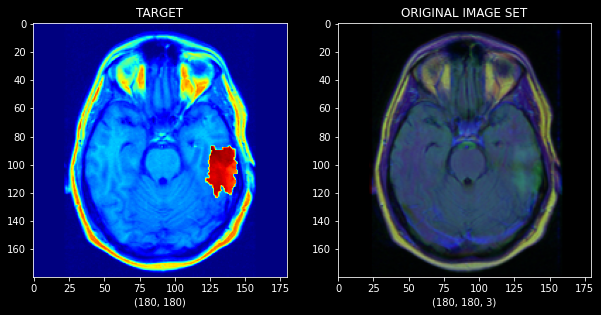

In [112]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_Set_B[13],cmap="jet")
axis[0].set_xlabel(Transformation_Set_B[13].shape)
axis[0].set_title("TARGET")
axis[1].imshow(Train_Set_B[13])
axis[1].set_xlabel(Train_Set_B[13].shape)
axis[1].set_title("ORIGINAL IMAGE SET")

# PARAMETERS AND CALLBACKS

In [113]:
Checkpoint_Model = tf.keras.callbacks.ModelCheckpoint(monitor="val_accuracy",
                                                      save_best_only=True,
                                                      save_weights_only=True,
                                                      filepath="./modelcheck")
Reduce_Model = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_accuracy",
                                                   factor=0.2,
                                                    min_delta=0.0001,
                                                   patience=5)

In [114]:
compile_loss = "binary_crossentropy"
compile_optimizer = Adam(lr=0.000001, epsilon=0.1)
output_class = 1

# MODEL FOR FIRST SET

#### STRUCTURE

In [115]:
E_AE = Sequential()
#
E_AE.add(Conv2D(32,(3,3),kernel_initializer = 'he_normal'))
E_AE.add(BatchNormalization())
E_AE.add(ReLU())
#
E_AE.add(Conv2D(64,(3,3),kernel_initializer = 'he_normal'))
E_AE.add(BatchNormalization())
E_AE.add(ReLU())
#
E_AE.add(Conv2D(128,(3,3),kernel_initializer = 'he_normal'))
E_AE.add(BatchNormalization())
E_AE.add(ReLU())
#
E_AE.add(Conv2D(256,(3,3),kernel_initializer = 'he_normal'))
E_AE.add(BatchNormalization())
E_AE.add(ReLU())



D_AE = Sequential()
#
D_AE.add(Conv2DTranspose(128,(3,3)))
D_AE.add(ReLU())
#
D_AE.add(Conv2DTranspose(64,(3,3)))
D_AE.add(ReLU())
#
D_AE.add(Conv2DTranspose(32,(3,3)))
D_AE.add(ReLU())
#
D_AE.add(Conv2DTranspose(3,(3,3)))
D_AE.add(ReLU())

In [116]:
Auto_Encoder = Sequential([E_AE,D_AE])
Auto_Encoder.compile(loss=compile_loss,optimizer=compile_optimizer,metrics=["mse"])

#### TRAINING

In [117]:
Model_AutoEncoder = Auto_Encoder.fit(Train_Set[:1000],Transformation_Set[:1000],epochs=20,callbacks=[Checkpoint_Model,Reduce_Model])

Epoch 1/20
32/32 [==============================] - 42s 801ms/step - loss: 1.2017 - mse: 0.0338
Epoch 2/20
32/32 [==============================] - 24s 760ms/step - loss: 1.2221 - mse: 0.0347
Epoch 3/20
32/32 [==============================] - 25s 786ms/step - loss: 1.2010 - mse: 0.0344
Epoch 4/20
32/32 [==============================] - 26s 811ms/step - loss: 1.2080 - mse: 0.0347
Epoch 5/20
32/32 [==============================] - 26s 796ms/step - loss: 1.1849 - mse: 0.0345
Epoch 6/20
32/32 [==============================] - 25s 794ms/step - loss: 1.1620 - mse: 0.0344
Epoch 7/20
32/32 [==============================] - 26s 800ms/step - loss: 1.1539 - mse: 0.0344
Epoch 8/20
32/32 [==============================] - 26s 799ms/step - loss: 1.1285 - mse: 0.0342
Epoch 9/20
32/32 [==============================] - 26s 797ms/step - loss: 1.1182 - mse: 0.0345
Epoch 10/20
32/32 [==============================] - 26s 797ms/step - loss: 1.0967 - mse: 0.0347
Epoch 11/20
32/32 [====================

#### PREDICTION SAME IMAGE SET

In [118]:
Prediction_Seen = Auto_Encoder.predict(Train_Set[:20])

Text(0.5, 1.0, 'PREDICTION')

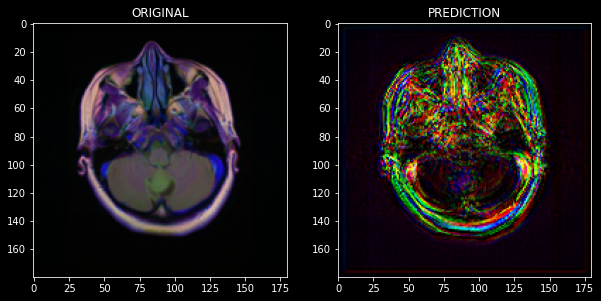

In [119]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Train_Set[1])
axis[0].set_title("ORIGINAL")

axis[1].imshow(Prediction_Seen[1])
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

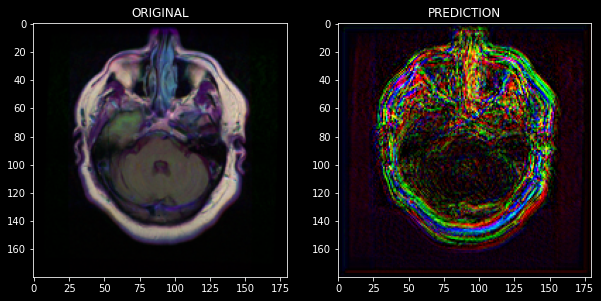

In [120]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Train_Set[2])
axis[0].set_title("ORIGINAL")

axis[1].imshow(Prediction_Seen[2],cmap="jet")
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

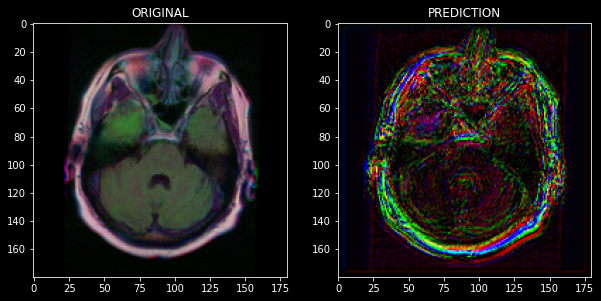

In [121]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Train_Set[3])
axis[0].set_title("ORIGINAL")

axis[1].imshow(Prediction_Seen[3],cmap="hot")
axis[1].set_title("PREDICTION")

#### PREDICTION DIFFERENT IMAGE SET

In [122]:
Prediction_Non_Seen = Auto_Encoder.predict(Train_Set[1350:])

Text(0.5, 1.0, 'PREDICTION')

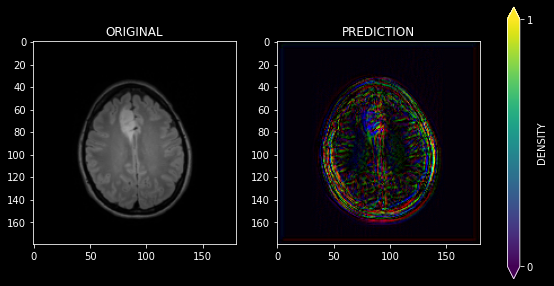

In [123]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1350])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[0])
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

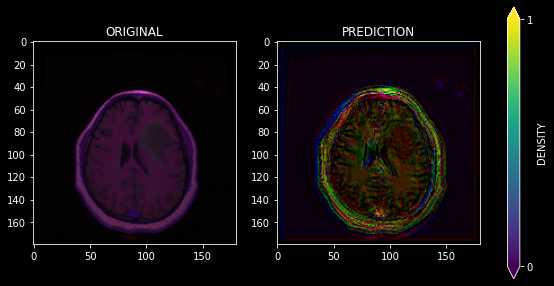

In [124]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1351])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[1])
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

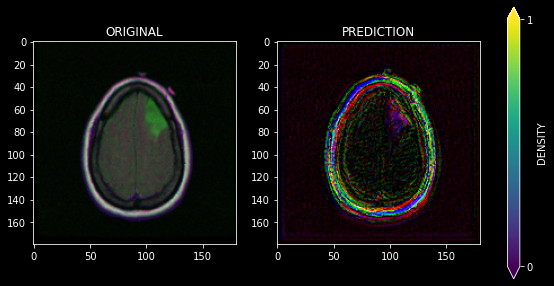

In [125]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1352])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[2])
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

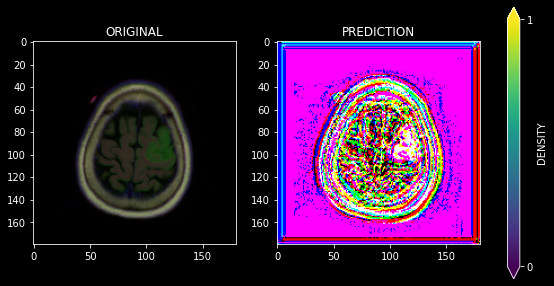

In [126]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1353])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[3]*255.) # SOMETİMES YOU NEED * 255. / THAT İS JUST FOR EXAMPLE
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

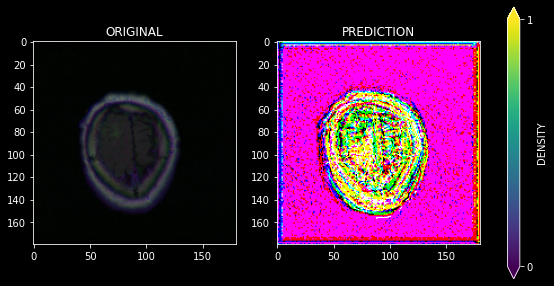

In [127]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1354])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[4]*255.) # SOMETİMES YOU NEED * 255. / THAT İS JUST FOR EXAMPLE
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

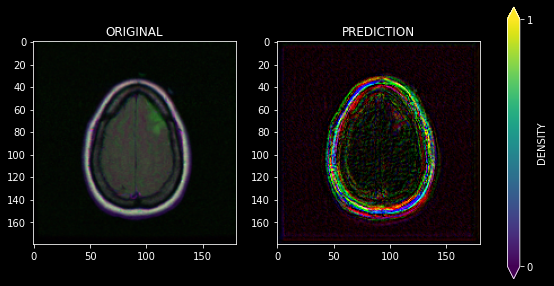

In [128]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1357])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[7]) 
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

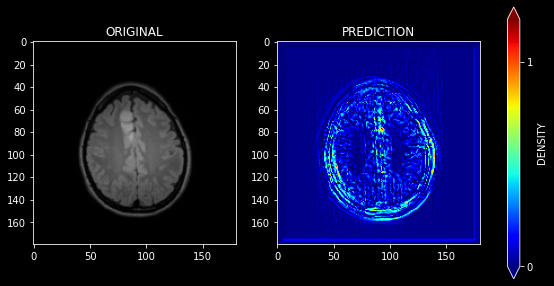

In [129]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1359])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[9][:,:,0],cmap="jet") 
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

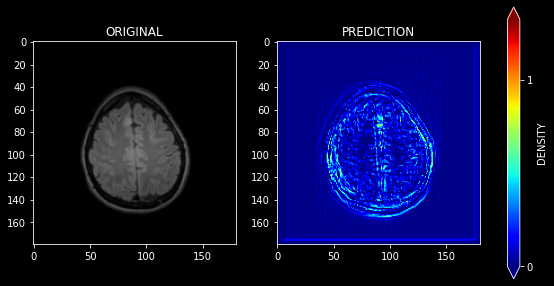

In [130]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1369])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[19][:,:,0],cmap="jet") 
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

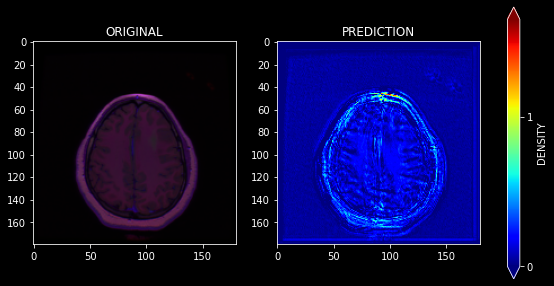

In [131]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set[1370])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen[20][:,:,0],cmap="jet")
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

# MODEL FOR SECOND SET

#### STRUCTURE

In [132]:
E_AE_II = Sequential()
#
E_AE_II.add(Conv2D(32,(5,5),kernel_initializer = 'he_normal',padding="same",use_bias=True))
E_AE_II.add(BatchNormalization())
E_AE_II.add(ReLU())
#
E_AE_II.add(Conv2D(64,(5,5),kernel_initializer = 'he_normal',padding="same",use_bias=True))
E_AE_II.add(BatchNormalization())
E_AE_II.add(ReLU())
#
E_AE_II.add(Conv2D(128,(5,5),kernel_initializer = 'he_normal',padding="same",use_bias=True))
E_AE_II.add(BatchNormalization())
E_AE_II.add(ReLU())



D_AE_II = Sequential()
#
D_AE_II.add(Conv2DTranspose(64,(5,5),padding="same"))
D_AE_II.add(ReLU())
#
D_AE_II.add(Conv2DTranspose(32,(5,5),padding="same"))
D_AE_II.add(ReLU())
#
D_AE_II.add(Conv2DTranspose(1,(5,5),padding="same"))
D_AE_II.add(ReLU())

In [133]:
Auto_Encoder_II = Sequential([E_AE_II,D_AE_II])
Auto_Encoder_II.compile(loss=compile_loss,optimizer=compile_optimizer,metrics=["mse"])

#### TRAINING AND PREDICTION

In [134]:
Model_AutoEncoder_II = Auto_Encoder_II.fit(Train_Set_B[:1000],Transformation_Set_B[:1000],epochs=30)

Epoch 1/30
32/32 [==============================] - 21s 426ms/step - loss: 1.4814 - mse: 0.2035
Epoch 2/30
32/32 [==============================] - 12s 388ms/step - loss: 1.3290 - mse: 0.1557
Epoch 3/30
32/32 [==============================] - 12s 388ms/step - loss: 1.2627 - mse: 0.1290
Epoch 4/30
32/32 [==============================] - 12s 387ms/step - loss: 1.1787 - mse: 0.1122
Epoch 5/30
32/32 [==============================] - 12s 387ms/step - loss: 1.1387 - mse: 0.0999
Epoch 6/30
32/32 [==============================] - 12s 386ms/step - loss: 1.0602 - mse: 0.0939
Epoch 7/30
32/32 [==============================] - 12s 387ms/step - loss: 1.0398 - mse: 0.0870
Epoch 8/30
32/32 [==============================] - 12s 387ms/step - loss: 1.0113 - mse: 0.0806
Epoch 9/30
32/32 [==============================] - 12s 387ms/step - loss: 0.9857 - mse: 0.0765
Epoch 10/30
32/32 [==============================] - 12s 387ms/step - loss: 0.9576 - mse: 0.0752
Epoch 11/30
32/32 [====================

In [135]:
Prediction_Seen_II = Auto_Encoder_II.predict(Train_Set_B[:20])

Text(0.5, 1.0, 'PREDICTION')

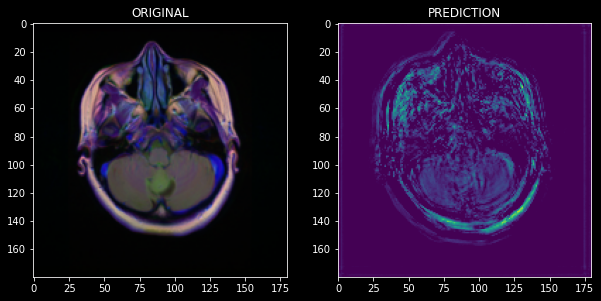

In [136]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Train_Set_B[1])
axis[0].set_title("ORIGINAL")

axis[1].imshow(Prediction_Seen_II[1])
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

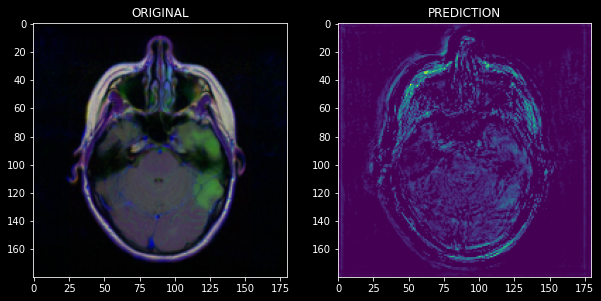

In [137]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Train_Set_B[10])
axis[0].set_title("ORIGINAL")

axis[1].imshow(Prediction_Seen_II[10])
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

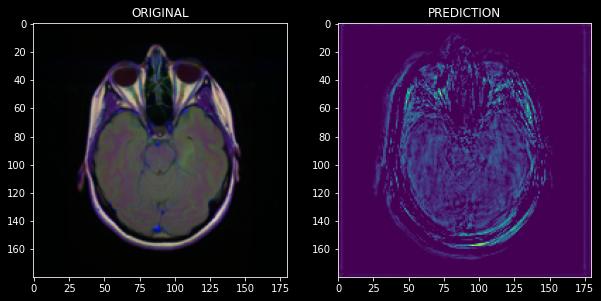

In [138]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Train_Set_B[12])
axis[0].set_title("ORIGINAL")

axis[1].imshow(Prediction_Seen_II[12])
axis[1].set_title("PREDICTION")

In [139]:
Prediction_Non_Seen_II = Auto_Encoder_II.predict(Train_Set_B[1350:])

Text(0.5, 1.0, 'PREDICTION')

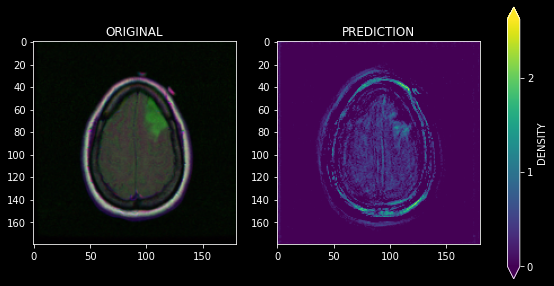

In [140]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set_B[1352])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen_II[2])
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

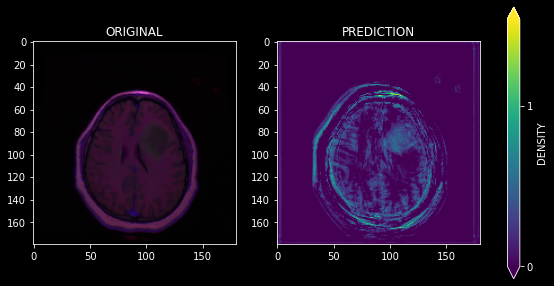

In [141]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(Train_Set_B[1356])
axis[0].set_title("ORIGINAL")
Ploting_Attr = axis[1].imshow(Prediction_Non_Seen_II[6])
figure.colorbar(Ploting_Attr, ax=axis.ravel().tolist(), shrink=0.5,extend='both',ticks=range(6),label='DENSITY')
axis[1].set_title("PREDICTION")

# MODEL II

#### TRANSFORMATION

In [142]:
BT_List = []
Mask_List = []

for bt_i,mask_i in zip(MASK_1_True.IMAGE.values,MASK_1_True.MASK.values):
    
    Reading_IMG_BT = cv2.cvtColor(cv2.imread(bt_i),cv2.COLOR_BGR2RGB)
    Reading_IMG_BT = cv2.resize(Reading_IMG_BT,(180,180))
    Reading_IMG_BT = Reading_IMG_BT / 255.
    
    Reading_IMG_Mask = cv2.cvtColor(cv2.imread(mask_i),cv2.COLOR_BGR2RGB)
    Reading_IMG_Mask = cv2.resize(Reading_IMG_Mask,(180,180))
    Reading_IMG_Mask = Reading_IMG_Mask / 255.
    
    BT_List.append(Reading_IMG_BT)
    Mask_List.append(Reading_IMG_Mask[:,:,0])

In [143]:
BT_Array = np.array(BT_List)
Mask_Array = np.array(Mask_List)

In [144]:
print("MASK ARRAY SHAPE: ",Mask_Array.shape)
print("WATER ARRAY SHAPE: ",BT_Array.shape)

MASK ARRAY SHAPE:  (1373, 180, 180)
WATER ARRAY SHAPE:  (1373, 180, 180, 3)


In [145]:
Encoder_G = Sequential()
Encoder_G.add(Conv2D(32,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())
#
Encoder_G.add(Conv2D(64,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())
#
Encoder_G.add(Conv2D(128,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())

Decoder_G = Sequential()
Decoder_G.add(Conv2DTranspose(64,(2,2)))
Decoder_G.add(ReLU())
#
Decoder_G.add(Conv2DTranspose(32,(2,2)))
Decoder_G.add(ReLU())
#
Decoder_G.add(Conv2DTranspose(1,(2,2)))
Decoder_G.add(ReLU())

In [146]:
A_Encoder = Sequential([Encoder_G,Decoder_G])

In [147]:
A_Encoder.compile(loss="binary_crossentropy",optimizer="adam",metrics=["accuracy"])

In [148]:
AE_Model = A_Encoder.fit(BT_Array,Mask_Array,epochs=25)

Epoch 1/25
43/43 [==============================] - 18s 363ms/step - loss: 0.2034 - accuracy: 0.9641
Epoch 2/25
43/43 [==============================] - 14s 327ms/step - loss: 0.0793 - accuracy: 0.9766
Epoch 3/25
43/43 [==============================] - 14s 324ms/step - loss: 0.0855 - accuracy: 0.9752
Epoch 4/25
43/43 [==============================] - 14s 319ms/step - loss: 0.0922 - accuracy: 0.9725
Epoch 5/25
43/43 [==============================] - 14s 316ms/step - loss: 0.0711 - accuracy: 0.9776
Epoch 6/25
43/43 [==============================] - 14s 316ms/step - loss: 0.0660 - accuracy: 0.9777
Epoch 7/25
43/43 [==============================] - 14s 318ms/step - loss: 0.0708 - accuracy: 0.9771
Epoch 8/25
43/43 [==============================] - 14s 320ms/step - loss: 0.0678 - accuracy: 0.9760
Epoch 9/25
43/43 [==============================] - 14s 320ms/step - loss: 0.0602 - accuracy: 0.9781
Epoch 10/25
43/43 [==============================] - 14s 319ms/step - loss: 0.0568 - accura

In [149]:
Prediction_IMG = A_Encoder.predict(BT_Array[:10])

Text(0.5, 1.0, 'TUMOR')

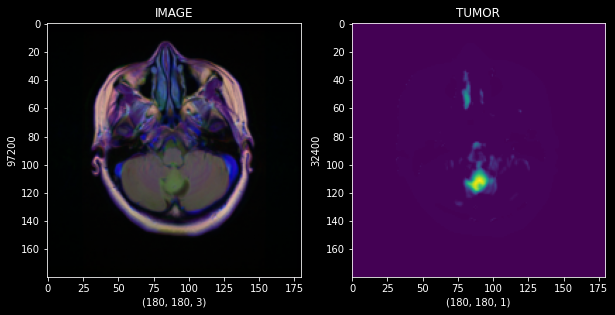

In [150]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
prediction_img_number = 1

Original_Img = BT_Array[prediction_img_number]
Predict_Mask = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("TUMOR")

Text(0.5, 1.0, 'TUMOR')

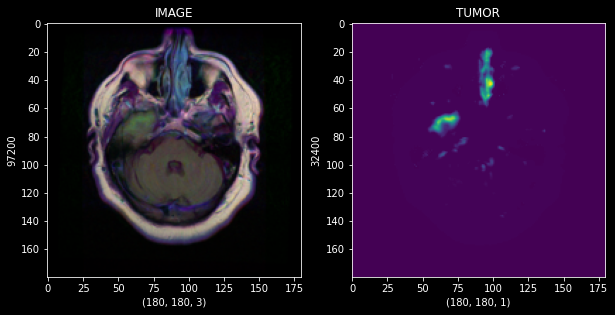

In [151]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
prediction_img_number = 2

Original_Img = BT_Array[prediction_img_number]
Predict_Mask = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("TUMOR")

Text(0.5, 1.0, 'TUMOR')

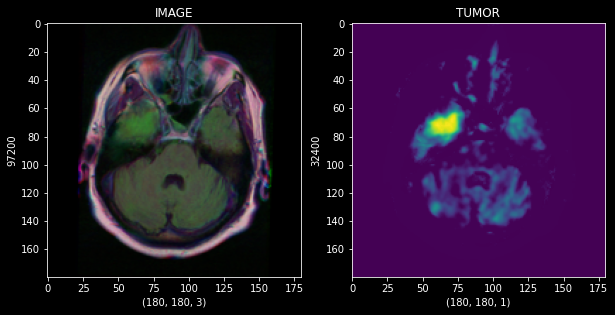

In [152]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
prediction_img_number = 3

Original_Img = BT_Array[prediction_img_number]
Predict_Mask = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("TUMOR")

Text(0.5, 1.0, 'TUMOR')

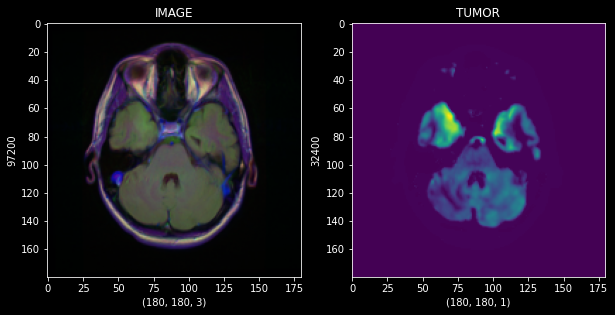

In [153]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
prediction_img_number = 4

Original_Img = BT_Array[prediction_img_number]
Predict_Mask = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("TUMOR")

Text(0.5, 1.0, 'TUMOR')

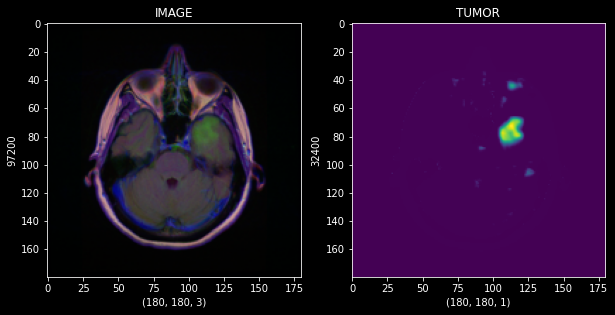

In [154]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
prediction_img_number = 5

Original_Img = BT_Array[prediction_img_number]
Predict_Mask = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("TUMOR")